In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium.plugins import HeatMap, MarkerCluster
import warnings
warnings.filterwarnings('ignore')

# Configuration pour les graphiques en français
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

# Chargement des données
print("Chargement des données...")
df = pd.read_csv('assets/caract-2023.csv', sep=';', encoding='utf-8')
print(f"Données chargées : {len(df)} enregistrements")
print(f"\nColonnes : {df.columns.tolist()}")
print(f"\nPremières lignes :")
print(df.head())


Chargement des données...
Données chargées : 54822 enregistrements

Colonnes : ['Num_Acc', 'jour', 'mois', 'an', 'hrmn', 'lum', 'dep', 'com', 'agg', 'int', 'atm', 'col', 'adr', 'lat', 'long']

Premières lignes :
        Num_Acc  jour  mois    an   hrmn  lum dep    com  agg  int  atm  col  \
0  202300000001     7     5  2023  06:00    1  75  75101    2    4    2    7   
1  202300000002     7     5  2023  05:30    5  94  94080    2    1    3    6   
2  202300000003     7     5  2023  20:50    1  94  94022    2    3    2    1   
3  202300000004     6     5  2023  23:57    5  94  94078    2    1    3    5   
4  202300000005     7     5  2023  00:50    5  94  94068    2    2    3    3   

                         adr          lat        long  
0              RUE DE RIVOLI  48,86638600  2,32347100  
1            Avenue de Paris  48,84547782  2,42868146  
2  Avenue du Général Leclerc  48,76240000  2,40655000  
3               Rue de Paris  48,73248432  2,44687575  
4       56bis Avenue Raspai

In [2]:
# Nettoyage et préparation des données géographiques
# Conversion des coordonnées (format français avec virgule)
df['lat'] = df['lat'].astype(str).str.replace(',', '.').astype(float)
df['long'] = df['long'].astype(str).str.replace(',', '.').astype(float)

# Nettoyage des codes département et commune
df['dep'] = df['dep'].astype(str).str.strip()
df['com'] = df['com'].astype(str).str.strip()

# Filtrage des données valides (coordonnées valides pour la France métropolitaine et DOM-TOM)
df_geo = df[(df['lat'].between(-21.5, 51.5)) & (df['long'].between(-61, 10))].copy()

print(f"Enregistrements avec coordonnées valides : {len(df_geo)}")
print(f"Enregistrements sans coordonnées valides : {len(df) - len(df_geo)}")
print(f"\nNombre de départements uniques : {df_geo['dep'].nunique()}")
print(f"Nombre de communes uniques : {df_geo['com'].nunique()}")


Enregistrements avec coordonnées valides : 52403
Enregistrements sans coordonnées valides : 2419

Nombre de départements uniques : 100
Nombre de communes uniques : 11175


In [3]:
# ============================================================================
# STATISTIQUES DESCRIPTIVES - DÉPARTEMENTS
# ============================================================================
print("="*80)
print("STATISTIQUES DESCRIPTIVES - DÉPARTEMENTS")
print("="*80)

# Fréquences par département
freq_dep = df_geo['dep'].value_counts().sort_values(ascending=False)
freq_dep_pct = (freq_dep / len(df_geo) * 100).round(2)

print(f"\nNombre total de départements : {len(freq_dep)}")
print(f"Nombre total d'accidents : {freq_dep.sum()}")
print(f"\nFréquence par département (Top 20) :")
print("-" * 60)
for i, (dep, count) in enumerate(freq_dep.head(20).items(), 1):
    pct = freq_dep_pct[dep]
    print(f"{i:2d}. Département {dep:5s}: {count:6d} accidents ({pct:5.2f}%)")

print(f"\nStatistiques descriptives :")
print(f"Moyenne d'accidents par département : {freq_dep.mean():.2f}")
print(f"Médiane d'accidents par département : {freq_dep.median():.2f}")
print(f"Écart-type : {freq_dep.std():.2f}")
print(f"Minimum : {freq_dep.min()} (Département {freq_dep.idxmin()})")
print(f"Maximum : {freq_dep.max()} (Département {freq_dep.idxmax()})")
print(f"Quartile Q1 : {freq_dep.quantile(0.25):.2f}")
print(f"Quartile Q3 : {freq_dep.quantile(0.75):.2f}")

# Création d'un DataFrame pour les visualisations
df_dep_stats = pd.DataFrame({
    'dep': freq_dep.index,
    'nb_accidents': freq_dep.values,
    'pourcentage': freq_dep_pct.values
})


STATISTIQUES DESCRIPTIVES - DÉPARTEMENTS

Nombre total de départements : 100
Nombre total d'accidents : 52403

Fréquence par département (Top 20) :
------------------------------------------------------------
 1. Département 75   :   4763 accidents ( 9.09%)
 2. Département 93   :   2650 accidents ( 5.06%)
 3. Département 92   :   2563 accidents ( 4.89%)
 4. Département 94   :   2204 accidents ( 4.21%)
 5. Département 13   :   2057 accidents ( 3.93%)
 6. Département 69   :   1921 accidents ( 3.67%)
 7. Département 91   :   1319 accidents ( 2.52%)
 8. Département 33   :   1189 accidents ( 2.27%)
 9. Département 59   :   1004 accidents ( 1.92%)
10. Département 95   :    906 accidents ( 1.73%)
11. Département 77   :    892 accidents ( 1.70%)
12. Département 64   :    879 accidents ( 1.68%)
13. Département 06   :    835 accidents ( 1.59%)
14. Département 83   :    804 accidents ( 1.53%)
15. Département 76   :    790 accidents ( 1.51%)
16. Département 35   :    731 accidents ( 1.39%)
17. Dép

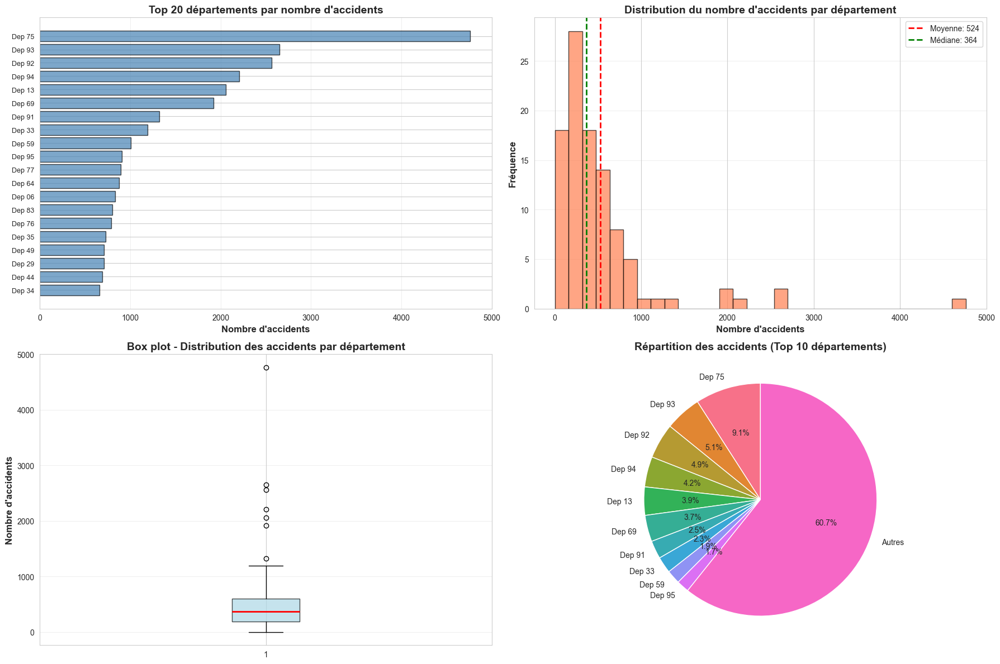

In [4]:
# Visualisation des statistiques départementales
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# 1. Top 20 départements
top_20 = freq_dep.head(20)
axes[0, 0].barh(range(len(top_20)), top_20.values, color='steelblue', alpha=0.7, edgecolor='black')
axes[0, 0].set_yticks(range(len(top_20)))
axes[0, 0].set_yticklabels([f"Dep {d}" for d in top_20.index], fontsize=9)
axes[0, 0].set_xlabel('Nombre d\'accidents', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Top 20 départements par nombre d\'accidents', fontsize=14, fontweight='bold')
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

# 2. Distribution des fréquences
axes[0, 1].hist(freq_dep.values, bins=30, color='coral', alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('Nombre d\'accidents', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Fréquence', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Distribution du nombre d\'accidents par département', fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='y', alpha=0.3)
axes[0, 1].axvline(freq_dep.mean(), color='red', linestyle='--', linewidth=2, label=f'Moyenne: {freq_dep.mean():.0f}')
axes[0, 1].axvline(freq_dep.median(), color='green', linestyle='--', linewidth=2, label=f'Médiane: {freq_dep.median():.0f}')
axes[0, 1].legend()

# 3. Box plot
axes[1, 0].boxplot(freq_dep.values, vert=True, patch_artist=True,
                   boxprops=dict(facecolor='lightblue', alpha=0.7),
                   medianprops=dict(color='red', linewidth=2))
axes[1, 0].set_ylabel('Nombre d\'accidents', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Box plot - Distribution des accidents par département', fontsize=14, fontweight='bold')
axes[1, 0].grid(axis='y', alpha=0.3)

# 4. Camembert pour les 10 premiers départements
top_10 = freq_dep.head(10)
autres = freq_dep.iloc[10:].sum()
pie_data = list(top_10.values) + [autres]
pie_labels = [f"Dep {d}" for d in top_10.index] + ['Autres']
axes[1, 1].pie(pie_data, labels=pie_labels, autopct='%1.1f%%',
               startangle=90, colors=sns.color_palette("husl", len(pie_data)))
axes[1, 1].set_title('Répartition des accidents (Top 10 départements)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


In [5]:
# ============================================================================
# STATISTIQUES DESCRIPTIVES - COMMUNES
# ============================================================================
print("\n" + "="*80)
print("STATISTIQUES DESCRIPTIVES - COMMUNES")
print("="*80)

# Fréquences par commune
freq_com = df_geo['com'].value_counts().sort_values(ascending=False)
freq_com_pct = (freq_com / len(df_geo) * 100).round(2)

print(f"\nNombre total de communes : {len(freq_com)}")
print(f"Nombre total d'accidents : {freq_com.sum()}")
print(f"\nFréquence par commune (Top 20) :")
print("-" * 60)
for i, (com, count) in enumerate(freq_com.head(20).items(), 1):
    pct = freq_com_pct[com]
    print(f"{i:2d}. Commune {com:6s}: {count:6d} accidents ({pct:5.2f}%)")

print(f"\nStatistiques descriptives :")
print(f"Moyenne d'accidents par commune : {freq_com.mean():.2f}")
print(f"Médiane d'accidents par commune : {freq_com.median():.2f}")
print(f"Écart-type : {freq_com.std():.2f}")
print(f"Minimum : {freq_com.min()} (Commune {freq_com.idxmin()})")
print(f"Maximum : {freq_com.max()} (Commune {freq_com.idxmax()})")
print(f"Quartile Q1 : {freq_com.quantile(0.25):.2f}")
print(f"Quartile Q3 : {freq_com.quantile(0.75):.2f}")

# Analyse de la concentration
print(f"\nConcentration des accidents :")
print(f"Top 10 communes représentent {freq_com.head(10).sum()} accidents ({freq_com.head(10).sum()/len(df_geo)*100:.2f}%)")
print(f"Top 50 communes représentent {freq_com.head(50).sum()} accidents ({freq_com.head(50).sum()/len(df_geo)*100:.2f}%)")
print(f"Top 100 communes représentent {freq_com.head(100).sum()} accidents ({freq_com.head(100).sum()/len(df_geo)*100:.2f}%)")

# Création d'un DataFrame pour les visualisations
df_com_stats = pd.DataFrame({
    'com': freq_com.index,
    'nb_accidents': freq_com.values,
    'pourcentage': freq_com_pct.values
})



STATISTIQUES DESCRIPTIVES - COMMUNES

Nombre total de communes : 11175
Nombre total d'accidents : 52403

Fréquence par commune (Top 20) :
------------------------------------------------------------
 1. Commune 75116 :    506 accidents ( 0.97%)
 2. Commune 97302 :    441 accidents ( 0.84%)
 3. Commune 75117 :    364 accidents ( 0.69%)
 4. Commune 75112 :    350 accidents ( 0.67%)
 5. Commune 75119 :    348 accidents ( 0.66%)
 6. Commune 75115 :    341 accidents ( 0.65%)
 7. Commune 75114 :    328 accidents ( 0.63%)
 8. Commune 75120 :    316 accidents ( 0.60%)
 9. Commune 75113 :    306 accidents ( 0.58%)
10. Commune 35238 :    300 accidents ( 0.57%)
11. Commune 72181 :    281 accidents ( 0.54%)
12. Commune 49007 :    279 accidents ( 0.53%)
13. Commune 51454 :    274 accidents ( 0.52%)
14. Commune 75118 :    268 accidents ( 0.51%)
15. Commune 93066 :    265 accidents ( 0.51%)
16. Commune 92036 :    260 accidents ( 0.50%)
17. Commune 87085 :    255 accidents ( 0.49%)
18. Commune 75108 

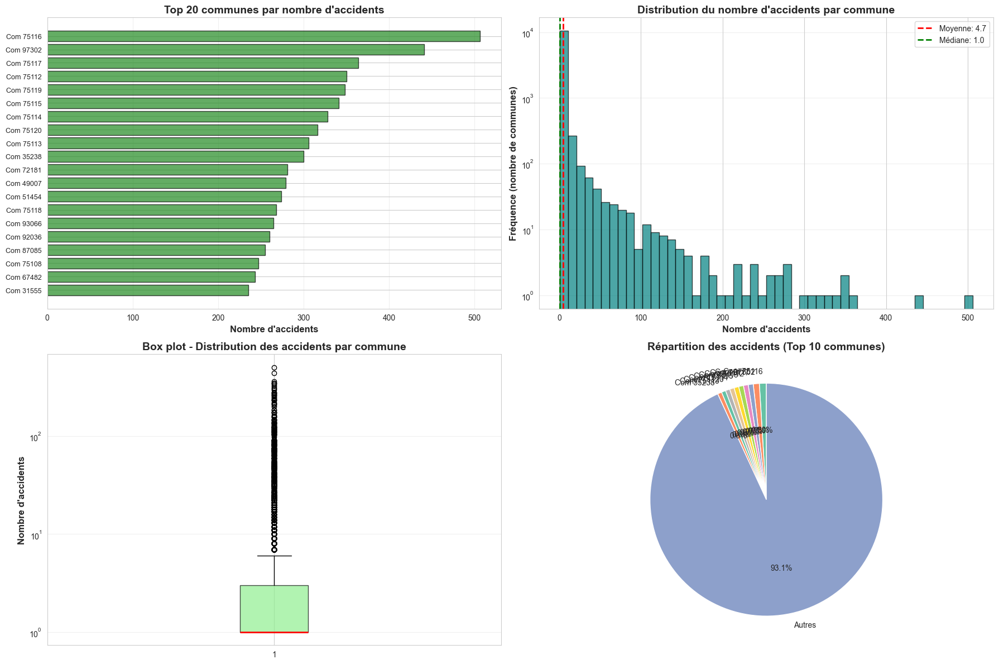

In [6]:
# Visualisation des statistiques communales
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# 1. Top 20 communes
top_20_com = freq_com.head(20)
axes[0, 0].barh(range(len(top_20_com)), top_20_com.values, color='forestgreen', alpha=0.7, edgecolor='black')
axes[0, 0].set_yticks(range(len(top_20_com)))
axes[0, 0].set_yticklabels([f"Com {c}" for c in top_20_com.index], fontsize=9)
axes[0, 0].set_xlabel('Nombre d\'accidents', fontsize=12, fontweight='bold')
axes[0, 0].set_title('Top 20 communes par nombre d\'accidents', fontsize=14, fontweight='bold')
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

# 2. Distribution des fréquences (log scale pour mieux voir la distribution)
axes[0, 1].hist(freq_com.values, bins=50, color='teal', alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('Nombre d\'accidents', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Fréquence (nombre de communes)', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Distribution du nombre d\'accidents par commune', fontsize=14, fontweight='bold')
axes[0, 1].set_yscale('log')
axes[0, 1].grid(axis='y', alpha=0.3)
axes[0, 1].axvline(freq_com.mean(), color='red', linestyle='--', linewidth=2, label=f'Moyenne: {freq_com.mean():.1f}')
axes[0, 1].axvline(freq_com.median(), color='green', linestyle='--', linewidth=2, label=f'Médiane: {freq_com.median():.1f}')
axes[0, 1].legend()

# 3. Box plot
axes[1, 0].boxplot(freq_com.values, vert=True, patch_artist=True,
                   boxprops=dict(facecolor='lightgreen', alpha=0.7),
                   medianprops=dict(color='red', linewidth=2))
axes[1, 0].set_ylabel('Nombre d\'accidents', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Box plot - Distribution des accidents par commune', fontsize=14, fontweight='bold')
axes[1, 0].set_yscale('log')
axes[1, 0].grid(axis='y', alpha=0.3)

# 4. Camembert pour les 10 premières communes
top_10_com = freq_com.head(10)
autres_com = freq_com.iloc[10:].sum()
pie_data_com = list(top_10_com.values) + [autres_com]
pie_labels_com = [f"Com {c}" for c in top_10_com.index] + ['Autres']
axes[1, 1].pie(pie_data_com, labels=pie_labels_com, autopct='%1.1f%%',
               startangle=90, colors=sns.color_palette("Set2", len(pie_data_com)))
axes[1, 1].set_title('Répartition des accidents (Top 10 communes)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


In [7]:
# ============================================================================
# GEOCHART - CARTE CHOROPLÈTHE PAR DÉPARTEMENT
# ============================================================================
print("\n" + "="*80)
print("GEOCHART - CARTE CHOROPLÈTHE PAR DÉPARTEMENT")
print("="*80)

# Préparation des données pour la carte choroplèthe
# Calcul du nombre d'accidents par département avec coordonnées moyennes
dep_coords = df_geo.groupby('dep').agg({
    'lat': 'mean',
    'long': 'mean',
    'Num_Acc': 'count'
}).reset_index()
dep_coords.columns = ['dep', 'lat', 'long', 'nb_accidents']

# Création de la carte choroplèthe avec Plotly
fig_dep = px.scatter_geo(
    dep_coords,
    lat='lat',
    lon='long',
    size='nb_accidents',
    color='nb_accidents',
    hover_name='dep',
    hover_data={'nb_accidents': True, 'lat': False, 'long': False},
    color_continuous_scale='Reds',
    size_max=50,
    title='Carte de France - Nombre d\'accidents par département (2023)',
    scope='europe',
    center={'lat': 46.5, 'lon': 2.5},
    projection='mercator',
    width=1000,
    height=800
)

fig_dep.update_geos(
    resolution=50,
    showcountries=True,
    countrycolor='gray',
    showcoastlines=True,
    coastlinecolor='gray',
    showland=True,
    landcolor='lightgray',
    fitbounds='locations'
)

fig_dep.update_layout(
    title_font_size=16,
    title_x=0.5,
    geo=dict(
        lonaxis_range=[-5, 10],
        lataxis_range=[41, 52]
    )
)

fig_dep.show()



GEOCHART - CARTE CHOROPLÈTHE PAR DÉPARTEMENT


In [8]:
# Carte interactive avec Folium - Heatmap par département
# Calcul des coordonnées moyennes et du nombre d'accidents par département
dep_heatmap_data = df_geo.groupby('dep').agg({
    'lat': 'mean',
    'long': 'mean',
    'Num_Acc': 'count'
}).reset_index()

# Création de la carte centrée sur la France
m = folium.Map(
    location=[46.5, 2.5],
    zoom_start=6,
    tiles='OpenStreetMap'
)

# Ajout des marqueurs pour chaque département
for idx, row in dep_heatmap_data.iterrows():
    dep = row['dep']
    lat = row['lat']
    lon = row['long']
    nb_accidents = row['Num_Acc']
    
    # Couleur selon le nombre d'accidents
    if nb_accidents > dep_heatmap_data['Num_Acc'].quantile(0.75):
        color = 'red'
    elif nb_accidents > dep_heatmap_data['Num_Acc'].quantile(0.5):
        color = 'orange'
    elif nb_accidents > dep_heatmap_data['Num_Acc'].quantile(0.25):
        color = 'yellow'
    else:
        color = 'green'
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=nb_accidents / 100,  # Ajuster le rayon selon les besoins
        popup=f"Département {dep}<br>Accidents: {nb_accidents}",
        tooltip=f"Dep {dep}: {nb_accidents} accidents",
        color='black',
        fillColor=color,
        fillOpacity=0.6,
        weight=1
    ).add_to(m)

# Ajout d'une heatmap avec tous les points d'accidents
heat_data = [[row['lat'], row['long']] for idx, row in df_geo.iterrows()]
HeatMap(heat_data, radius=10, blur=15, max_zoom=1).add_to(m)

print("Carte interactive créée avec Folium")
m.save('carte_accidents_departements.html')
print("Carte sauvegardée dans 'carte_accidents_departements.html'")
m


Carte interactive créée avec Folium
Carte sauvegardée dans 'carte_accidents_departements.html'


In [10]:
# ============================================================================
# GEOCHART - CARTE PAR COMMUNE
# ============================================================================
print("\n" + "="*80)
print("GEOCHART - CARTE PAR COMMUNE")
print("="*80)

# Calcul du nombre d'accidents par commune avec coordonnées moyennes
com_coords = df_geo.groupby('com').agg({
    'lat': 'mean',
    'long': 'mean',
    'Num_Acc': 'count'
}).reset_index()
com_coords.columns = ['com', 'lat', 'long', 'nb_accidents']

print(f"Nombre de communes avec données géographiques : {len(com_coords)}")

# Carte interactive avec Plotly pour les communes (Top 100 pour la lisibilité)
com_coords_top100 = com_coords.nlargest(100, 'nb_accidents')

fig_com = px.scatter_geo(
    com_coords_top100,
    lat='lat',
    lon='long',
    size='nb_accidents',
    color='nb_accidents',
    hover_name='com',
    hover_data={'nb_accidents': True, 'lat': False, 'long': False},
    color_continuous_scale='Oranges',
    size_max=30,
    title='Carte de France - Top 100 communes par nombre d\'accidents (2023)',
    scope='europe',
    center={'lat': 46.5, 'lon': 2.5},
    projection='mercator',
    width=1000,
    height=800
)

fig_com.update_geos(
    resolution=50,
    showcountries=True,
    countrycolor='gray',
    showcoastlines=True,
    coastlinecolor='gray',
    showland=True,
    landcolor='lightgray',
    fitbounds='locations'
)

fig_com.update_layout(
    title_font_size=16,
    title_x=0.5,
    geo=dict(
        lonaxis_range=[-5, 10],
        lataxis_range=[41, 52]
    )
)

fig_com.show()



GEOCHART - CARTE PAR COMMUNE
Nombre de communes avec données géographiques : 11175


In [11]:
# Carte interactive avec Folium - Clustering des communes
# Création d'une carte avec clustering pour améliorer les performances
m_com = folium.Map(
    location=[46.5, 2.5],
    zoom_start=6,
    tiles='OpenStreetMap'
)

# Ajout d'un cluster de marqueurs pour les communes (échantillonnage pour performance)
# On prend un échantillon pour éviter la surcharge
sample_size = min(5000, len(df_geo))
df_sample = df_geo.sample(n=sample_size, random_state=42)

marker_cluster = MarkerCluster().add_to(m_com)

for idx, row in df_sample.iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f"Commune {row['com']}<br>Département {row['dep']}",
        tooltip=f"Com {row['com']}, Dep {row['dep']}"
    ).add_to(marker_cluster)

# Ajout d'une heatmap
heat_data_com = [[row['lat'], row['long']] for idx, row in df_sample.iterrows()]
HeatMap(heat_data_com, radius=8, blur=12, max_zoom=1).add_to(m_com)

print(f"Carte interactive créée avec Folium (échantillon de {sample_size} accidents)")
m_com.save('carte_accidents_communes.html')
print("Carte sauvegardée dans 'carte_accidents_communes.html'")
m_com


Carte interactive créée avec Folium (échantillon de 5000 accidents)
Carte sauvegardée dans 'carte_accidents_communes.html'


In [12]:
# ============================================================================
# RÉSUMÉ ET EXPORT DES STATISTIQUES
# ============================================================================
print("\n" + "="*80)
print("RÉSUMÉ DES STATISTIQUES GÉOGRAPHIQUES")
print("="*80)

print(f"\n📊 RÉSUMÉ GÉNÉRAL")
print(f"{'='*60}")
print(f"Total d'accidents analysés : {len(df_geo):,}")
print(f"Nombre de départements : {df_geo['dep'].nunique()}")
print(f"Nombre de communes : {df_geo['com'].nunique()}")

print(f"\n📈 PAR DÉPARTEMENT")
print(f"{'='*60}")
print(f"Département avec le plus d'accidents : {freq_dep.idxmax()} ({freq_dep.max():,} accidents)")
print(f"Département avec le moins d'accidents : {freq_dep.idxmin()} ({freq_dep.min():,} accidents)")
print(f"Moyenne : {freq_dep.mean():.1f} accidents/département")
print(f"Médiane : {freq_dep.median():.1f} accidents/département")

print(f"\n🏘️ PAR COMMUNE")
print(f"{'='*60}")
print(f"Commune avec le plus d'accidents : {freq_com.idxmax()} ({freq_com.max():,} accidents)")
print(f"Commune avec le moins d'accidents : {freq_com.idxmin()} ({freq_com.min():,} accidents)")
print(f"Moyenne : {freq_com.mean():.1f} accidents/commune")
print(f"Médiane : {freq_com.median():.1f} accidents/commune")

# Export des statistiques
df_dep_stats.to_csv('statistiques_departements.csv', index=False, encoding='utf-8')
df_com_stats.to_csv('statistiques_communes.csv', index=False, encoding='utf-8')
print(f"\n✅ Statistiques exportées :")
print(f"   - statistiques_departements.csv")
print(f"   - statistiques_communes.csv")



RÉSUMÉ DES STATISTIQUES GÉOGRAPHIQUES

📊 RÉSUMÉ GÉNÉRAL
Total d'accidents analysés : 52,403
Nombre de départements : 100
Nombre de communes : 11175

📈 PAR DÉPARTEMENT
Département avec le plus d'accidents : 75 (4,763 accidents)
Département avec le moins d'accidents : 987 (1 accidents)
Moyenne : 524.0 accidents/département
Médiane : 364.0 accidents/département

🏘️ PAR COMMUNE
Commune avec le plus d'accidents : 75116 (506 accidents)
Commune avec le moins d'accidents : 25424 (1 accidents)
Moyenne : 4.7 accidents/commune
Médiane : 1.0 accidents/commune

✅ Statistiques exportées :
   - statistiques_departements.csv
   - statistiques_communes.csv
